In [1]:
# Copyright (c) Microsoft Corporation. All rights reserved.
# Licensed under the MIT License.

# in this notebook, we try to modify mask matrix so that the hours with no obs is encoded as a vector of all zeros.

In [2]:
# activate line execution
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import pandas as pd

In [3]:
# import pandas as pd
# import os
# import numpy as np

# loc = 'train'
# dic={'time':-1,'Age':0,'Gender':1,'Height':2,'ICUType':3,'Weight':4,'Albumin':5,\
#              'ALP':6,'ALT':7,'AST':8,'Bilirubin':9,'BUN':10,'Cholesterol':11,'Creatinine':12,\
#              'DiasABP':13,'FiO2':14,'GCS':15,'Glucose':16,'HCO3':17,'HCT':18,'HR':19,\
#              'K':20,'Lactate':21,'Mg':22,'MAP':23,'MechVent':24,'Na':25,'NIDiasABP':26,\
#              'NIMAP':27,'NISysABP':28,'PaCO2':29,'PaO2':30,'pH':31,'Platelets':32,'RespRate':33,\
#              'SaO2':34,'SysABP':35,'Temp':36,'TroponinI':37,'TroponinT':38,'Urine':39,'WBC':40}
# column2drop = ['HR','NIDiasABP', 'NIMAP', 'NISysABP','RespRate', 'Temp','DiasABP','MAP','SysABP', 'GCS','TroponinT','TroponinI']
# dic = {key: value for key, value in dic.items() if key not in column2drop}
# dic = {key:(i-1) for i,key in enumerate(dic.keys())}
# def handle(loc):
#     dataPath = '../Multivariate-Time-Series-Imputation-with-Generative-Adversarial-Networks/set-a/{}/'.format(loc)
#     labelFile = '../Multivariate-Time-Series-Imputation-with-Generative-Adversarial-Networks/set-a/{}/list.txt'.format(loc)
#     data_lis = []
#     with open(labelFile, "r") as f:
#         line_num = 0
#         for line in f.readlines():
#             if line_num!=0:
#                 words = line.strip().split(',') 
#                 if os.path.isfile(os.path.join(dataPath, words[0]+".txt")):
#                     data_lis.append((words[0]+".txt", words[len(words)-1]))
#             line_num += 1   

#     print(len(data_lis))        
#     sta = []
#     dyn = []
#     lis = [x for x,y in dic.items()]
#     print(lis)
#     for fileName, label in data_lis:
#         with open(os.path.join(dataPath, fileName)) as f:
#             #read_csv is DataFrame, need to be transformed into ndarray
#             count=0
#             age=gender=height=icutype=weight=np.nan
#             lastTime=0
#             totalData=[]
#             for line in f.readlines():
#                 if count > 1:
#                     words=line.split(",")
#                     timestamp=words[0]
#                     feature=words[1]
#                     value=words[2]
#                     if feature in column2drop:
#                         continue
#                     # -1 is missing value
#                     if timestamp == "00:00":
#                         if feature=='Age':
#                             age=float(value)
#                             if age == -1: age = np.nan
#                         if feature=='Gender':
#                             gender=int(value)
#                             if gender == -1: gender = np.nan
#                         if feature=='Height':
#                             height=float(value)
#                             if height == -1: height = np.nan
#                         if feature == 'ICUType':
#                             icutype=int(value)
#                             if icutype == -1: icutype = np.nan
#                         if feature=='Weight':
#                             weight=float(value)
#                             if weight == -1: weight = np.nan
#                     else:
#                         if timestamp!=lastTime:
#                             data=[np.nan]*len(dic)
#                             hourandminute=timestamp.split(":")
#                             data[0]=float(hourandminute[0])*60+float(hourandminute[1])
#                             """
#                             data[1]=float(age)
#                             data[2]=float(gender)
#                             data[3]=float(height)
#                             data[4]=float(icutype)
#                             data[5]=float(weight)
#                             """
#                             if float(value)!=-1:
#                                 data[dic[feature]]=float(value)
#                             # if feature == 'Weight':
#                             #     assert float(value) == float(weight)
#                             totalData.append(data)
#                         else:
#                             totalData[len(totalData)-1][dic[feature]]=float(value)
#                     lastTime=timestamp

#                 count+=1
#         sta.append([age,gender,height,icutype,weight,int(label)])
#         d = np.array(totalData)
#         #for i in range(len(d)-1, 0, -1):
#         #    d[i][0]-=d[i-1][0]
#         d = pd.DataFrame(d, columns=lis)
#         dyn.append(d.drop(columns=['Age', 'Gender','Height','ICUType','Weight', 'WBC']))
        
#     sta = pd.DataFrame(np.array(sta), columns=['Age', 'Gender','Height','ICUType','Weight', 'Label'])
#     return sta,dyn

In [4]:
path_data_raw = "C:\\DATA\\data\\raw\\physionet_challenge_2012\\"
dfx = pd.read_csv(path_data_raw+'p12.csv')


# time conversion
dfx['Time'] = dfx['Time'].apply(lambda x:       int(x.split(':')[0]) + int(x.split(':')[1])/60      )

# round time to 0 decimals
dfx['Time'] = dfx['Time'].apply(lambda x: round(x,0))

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\DATA\\data\\raw\\physionet_challenge_2012\\p12.csv'

In [5]:
dfx[dfx.RecordID==132539]

,Unnamed: 0,Time,Age,BUN,Creatinine,GCS,Gender,Glucose,HCO3,HCT,...,Cholesterol,TroponinI,TroponinT,Hospital,Unnamed: 45,SAPS-I,SOFA,Length_of_stay,Survival,In-hospital_death
0,0,0.0,54.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,0,NaN,6,1,5,-1,0
1,1,0.0,NaN,NaN,NaN,15.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0,NaN,6,1,5,-1,0
2,2,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0,NaN,6,1,5,-1,0
3,3,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0,NaN,6,1,5,-1,0
4,4,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0,NaN,6,1,5,-1,0
5,5,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33.7,...,NaN,NaN,NaN,0,NaN,6,1,5,-1,0
6,6,4.0,NaN,NaN,NaN,15.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0,NaN,6,1,5,-1,0
7,7,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0,NaN,6,1,5,-1,0
8,8,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0,NaN,6,1,5,-1,0
9,9,8.0,NaN,NaN,NaN,15.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0,NaN,6,1,5,-1,0


In [9]:
# ORIGINAL
import pandas as pd
import os
import numpy as np

loc = 'train'
dic={'time':-1,'Age':0,'Gender':1,'Height':2,'ICUType':3,'Weight':4,'Albumin':5,\
             'ALP':6,'ALT':7,'AST':8,'Bilirubin':9,'BUN':10,'Cholesterol':11,'Creatinine':12,\
             'DiasABP':13,'FiO2':14,'GCS':15,'Glucose':16,'HCO3':17,'HCT':18,'HR':19,\
             'K':20,'Lactate':21,'Mg':22,'MAP':23,'MechVent':24,'Na':25,'NIDiasABP':26,\
             'NIMAP':27,'NISysABP':28,'PaCO2':29,'PaO2':30,'pH':31,'Platelets':32,'RespRate':33,\
             'SaO2':34,'SysABP':35,'Temp':36,'TroponinI':37,'TroponinT':38,'Urine':39,'WBC':40}
column2drop = ['HR','NIDiasABP', 'NIMAP', 'NISysABP','RespRate', 'Temp','DiasABP','MAP','SysABP', 'GCS','TroponinT','TroponinI','Urine']
column2drop = []
dic = {key: value for key, value in dic.items() if key not in column2drop}
dic = {key:(i-1) for i,key in enumerate(dic.keys())}

def handle(loc):
    dataPath = '../Multivariate-Time-Series-Imputation-with-Generative-Adversarial-Networks/set-a/{}/'.format(loc)
    labelFile = '../Multivariate-Time-Series-Imputation-with-Generative-Adversarial-Networks/set-a/{}/list.txt'.format(loc)
    data_lis = []
    with open(labelFile, "r") as f:
        line_num = 0
        for line in f.readlines():
            if line_num!=0:
                words = line.strip().split(',') 
                if os.path.isfile(os.path.join(dataPath, words[0]+".txt")):
                    data_lis.append((words[0]+".txt", words[len(words)-1]))
            line_num += 1   

    print(len(data_lis))        
    sta = []
    dyn = []
    lis = [x for x,y in dic.items()]
    print(lis)
    for fileName, label in data_lis:
        with open(os.path.join(dataPath, fileName)) as f:
            #read_csv is DataFrame, need to be transformed into ndarray
            count=0
            age=gender=height=icutype=weight=np.nan
            lastTime=0
            totalData=[]
            for line in f.readlines():
                if count > 1:
                    words=line.split(",")
                    timestamp=words[0]
                    feature=words[1]
                    value=words[2]
                    if feature=='Urine':
                        a=1
                    if feature in column2drop:
                        continue
                    # -1 is missing value
                    if timestamp == "00:00":
                        if feature=='Age':
                            age=float(value)
                            if age == -1: age = np.nan
                        if feature=='Gender':
                            gender=int(value)
                            if gender == -1: gender = np.nan
                        if feature=='Height':
                            height=float(value)
                            if height == -1: height = np.nan
                        if feature == 'ICUType':
                            icutype=int(value)
                            if icutype == -1: icutype = np.nan
                        if feature=='Weight':
                            weight=float(value)
                            if weight == -1: weight = np.nan
                    else:
                        if timestamp!=lastTime:
                            data=[np.nan]*len(dic)
                            hourandminute=timestamp.split(":")
                            data[0]=float(hourandminute[0])*60+float(hourandminute[1])
                            data[0]= float(data[0]/60)
                            # data[0]=int(hourandminute[0])*int(hourandminute[1])/60
                            """
                            data[1]=float(age)
                            data[2]=float(gender)
                            data[3]=float(height)
                            data[4]=float(icutype)
                            data[5]=float(weight)
                            """
                            if feature=='TroponinT':
                                a=1
                            if float(value)!=-1:
                                data[dic[feature]+1]=float(value)
                            # if feature == 'Weight':
                            #     assert float(value) == float(weight)
                            totalData.append(data)
                        else:
                            totalData[len(totalData)-1][dic[feature]+1]=float(value)
                    lastTime=timestamp

                count+=1
        if '132539' in fileName:
            a=1
        if len(totalData)==0:
            continue
        d = np.array(totalData)
        #for i in range(len(d)-1, 0, -1):
        #    d[i][0]-=d[i-1][0]
        d2 = pd.DataFrame(d, columns=lis)
        d2 = d2.drop(columns=['Age', 'Gender','Height','ICUType','Weight'])
        t = d2.iloc[:,1:].notnull().sum(axis=1)>0
        d2 = d2.loc[t]
        if len(d2)==0:
            continue
        dyn.append(d2)
        sta.append([age,gender,height,icutype,weight,int(label)])
        
    sta = pd.DataFrame(np.array(sta), columns=['Age', 'Gender','Height','ICUType','Weight', 'Label'])
    return sta,dyn

In [10]:
sta,dyn=handle('train')

3594
['time', 'Age', 'Gender', 'Height', 'ICUType', 'Weight', 'Albumin', 'ALP', 'ALT', 'AST', 'Bilirubin', 'BUN', 'Cholesterol', 'Creatinine', 'DiasABP', 'FiO2', 'GCS', 'Glucose', 'HCO3', 'HCT', 'HR', 'K', 'Lactate', 'Mg', 'MAP', 'MechVent', 'Na', 'NIDiasABP', 'NIMAP', 'NISysABP', 'PaCO2', 'PaO2', 'pH', 'Platelets', 'RespRate', 'SaO2', 'SysABP', 'Temp', 'TroponinI', 'TroponinT', 'Urine', 'WBC']


In [11]:
sta

,Age,Gender,Height,ICUType,Weight,Label
0,54.0,0.0,NaN,4.0,NaN,0.0
1,76.0,1.0,175.3,2.0,76.0,0.0
2,44.0,0.0,NaN,3.0,56.7,0.0
3,68.0,1.0,180.3,3.0,84.6,0.0
4,88.0,0.0,NaN,3.0,NaN,0.0
...,...,...,...,...,...,...
3589,39.0,1.0,177.8,3.0,87.1,0.0
3590,58.0,0.0,NaN,1.0,102.8,0.0
3591,90.0,1.0,NaN,3.0,78.0,0.0
3592,56.0,0.0,170.2,2.0,131.2,0.0


In [12]:
dyn[0]

,time,Albumin,ALP,ALT,AST,Bilirubin,BUN,Cholesterol,Creatinine,DiasABP,...,pH,Platelets,RespRate,SaO2,SysABP,Temp,TroponinI,TroponinT,Urine,WBC
0,0.116667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,19.0,NaN,NaN,35.1,NaN,NaN,900.0,NaN
1,0.616667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,19.0,NaN,NaN,35.6,NaN,NaN,60.0,NaN
2,1.616667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,18.0,NaN,NaN,NaN,NaN,NaN,30.0,NaN
3,2.616667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,19.0,NaN,NaN,NaN,NaN,NaN,170.0,NaN
4,3.133333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,3.616667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,20.0,NaN,NaN,37.8,NaN,NaN,60.0,NaN
6,4.616667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,20.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,5.616667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,17.0,NaN,NaN,NaN,NaN,NaN,170.0,NaN
8,7.616667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,15.0,NaN,NaN,38.1,NaN,NaN,120.0,NaN
9,8.616667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,14.0,NaN,NaN,NaN,NaN,NaN,80.0,NaN


(array([1.04340568e-03, 6.60823595e-04, 4.17362270e-04, 3.47801892e-04,
        1.35642738e-03, 3.75626043e-03, 1.60336672e-02, 2.07637730e-02,
        1.87813022e-02, 1.75292154e-02, 1.42598776e-02, 1.00862549e-02,
        7.30383973e-03, 4.55620479e-03, 3.44323873e-03, 1.98247078e-03,
        1.04340568e-03, 5.91263216e-04, 4.52142460e-04, 3.13021703e-04,
        1.39120757e-04, 3.47801892e-05, 0.00000000e+00, 6.95603784e-05,
        0.00000000e+00, 3.47801892e-05, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00]),
 array([  0.,   8.,  16.,  24.,  32.,  40.,  48.,  56.,  64.,  72.,  80.,
         88.,  96., 

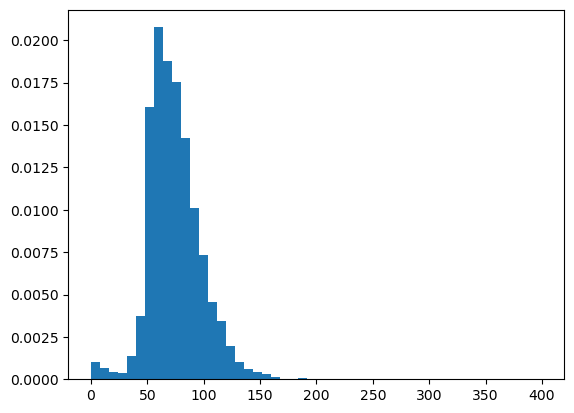

In [13]:
sta_types = ['int', 'binary', 'continuous', 'categorical','continuous','binary', 'int']
dyn_types = ['continuous']*len(dyn[0].columns)
dynamics = pd.concat(dyn)
seq_len = [len(x) for x in dyn]
sta["seq_len"]=np.array(seq_len)

%matplotlib inline
import matplotlib.pyplot as plt
plt.hist(seq_len, range=(0,400), bins=50, density=True)
plt.show()

In [14]:
dynamics

,time,Albumin,ALP,ALT,AST,Bilirubin,BUN,Cholesterol,Creatinine,DiasABP,...,pH,Platelets,RespRate,SaO2,SysABP,Temp,TroponinI,TroponinT,Urine,WBC
0,0.116667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,19.0,NaN,NaN,35.1,NaN,NaN,900.0,NaN
1,0.616667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,19.0,NaN,NaN,35.6,NaN,NaN,60.0,NaN
2,1.616667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,18.0,NaN,NaN,NaN,NaN,NaN,30.0,NaN
3,2.616667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,19.0,NaN,NaN,NaN,NaN,NaN,170.0,NaN
4,3.133333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107,45.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62.0,...,NaN,NaN,NaN,NaN,143.0,37.7,NaN,NaN,200.0,NaN
108,46.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58.0,...,NaN,NaN,NaN,NaN,137.0,NaN,NaN,NaN,100.0,NaN
109,47.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59.0,...,NaN,NaN,NaN,NaN,132.0,NaN,NaN,NaN,45.0,NaN
110,47.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
from general.missingprocessor import Processor
d_P = Processor(dyn_types, use_pri='time')
s_P = Processor(sta_types)
d_P.fit(dynamics)
s_P.fit(sta)

time 1 None continuous None
IGNORE
Albumin 1 0.9921190333983194 continuous None
IGNORE
all values are integer
ALP 1 0.9895646686275172 int None
IGNORE
all values are integer
ALT 1 0.9892791808001923 int None
IGNORE
all values are integer
AST 1 0.9892603987062893 int None
IGNORE
Bilirubin 1 0.9892115652621417 continuous None
IGNORE
BUN 1 0.9529020213289459 continuous None
IGNORE
all values are integer
Cholesterol 1 0.9989557155789957 int None
IGNORE
Creatinine 1 0.9526503412706462 continuous None
IGNORE
all values are integer
DiasABP 1 0.5072555228747122 int None
IGNORE
FiO2 1 0.8909962398248006 continuous None
IGNORE
all values are integer
GCS 1 0.7931039664025904 int None
IGNORE
all values are integer
Glucose 1 0.9559973104041531 int None
IGNORE
HCO3 1 0.9539425493311696 continuous None
IGNORE
HCT 1 0.9379852823512177 continuous None
IGNORE
HR 1 0.2261364105915984 continuous None
IGNORE
K 1 0.9512266585528021 continuous None
IGNORE
Lactate 1 0.9727321560716875 continuous None
IGNORE
M

In [16]:
s = s_P.transform(sta)
d_lis=[d_P.transform(ds) for ds in dyn]
d = [x[0].tolist() for x in d_lis]
lag = [x[1].tolist() for x in d_lis]
mask = [x[2].tolist() for x in d_lis]
times = [x[-1].tolist() for x in d_lis]
priv = [x[3].tolist() for x in d_lis]
nex = [x[4].tolist() for x in d_lis]
label = [float(x[-2]) for x in s]


In [17]:
times_raw = [x['time'].tolist() for x in dyn]


In [18]:
times[0]
times_raw[0]

[[0.0024305555555555556],
 [0.012847222222222222],
 [0.033680555555555554],
 [0.05451388888888889],
 [0.06527777777777777],
 [0.07534722222222222],
 [0.09618055555555555],
 [0.11701388888888888],
 [0.15868055555555555],
 [0.1795138888888889],
 [0.20034722222222223],
 [0.22118055555555555],
 [0.2420138888888889],
 [0.26284722222222223],
 [0.28368055555555555],
 [0.30451388888888886],
 [0.32534722222222223],
 [0.34618055555555555],
 [0.36701388888888886],
 [0.38784722222222223],
 [0.40868055555555555],
 [0.42951388888888886],
 [0.45034722222222223],
 [0.47118055555555555],
 [0.49201388888888886],
 [0.5128472222222222],
 [0.5336805555555555],
 [0.5545138888888889],
 [0.5753472222222222],
 [0.5961805555555555],
 [0.6170138888888889],
 [0.6378472222222222],
 [0.6586805555555555],
 [0.6795138888888889],
 [0.6899305555555555],
 [0.7003472222222222],
 [0.7211805555555555],
 [0.7420138888888889],
 [0.7628472222222222],
 [0.7836805555555555],
 [0.8045138888888889],
 [0.8253472222222222],
 [0.846

[0.11666666666666667,
 0.6166666666666667,
 1.6166666666666667,
 2.6166666666666667,
 3.1333333333333333,
 3.6166666666666667,
 4.616666666666666,
 5.616666666666666,
 7.616666666666666,
 8.616666666666667,
 9.616666666666667,
 10.616666666666667,
 11.616666666666667,
 12.616666666666667,
 13.616666666666667,
 14.616666666666667,
 15.616666666666667,
 16.616666666666667,
 17.616666666666667,
 18.616666666666667,
 19.616666666666667,
 20.616666666666667,
 21.616666666666667,
 22.616666666666667,
 23.616666666666667,
 24.616666666666667,
 25.616666666666667,
 26.616666666666667,
 27.616666666666667,
 28.616666666666667,
 29.616666666666667,
 30.616666666666667,
 31.616666666666667,
 32.61666666666667,
 33.11666666666667,
 33.61666666666667,
 34.61666666666667,
 35.61666666666667,
 36.61666666666667,
 37.61666666666667,
 38.61666666666667,
 39.61666666666667,
 40.61666666666667,
 41.61666666666667,
 42.61666666666667,
 43.61666666666667,
 44.61666666666667,
 45.61666666666667,
 46.6166666

In [19]:
def build_dataset(sta, dyn, seq_len):
    s = s_P.transform(sta)
    d_lis=[d_P.transform(ds) for ds in dyn]
    d = [x[0].tolist() for x in d_lis]
    lag = [x[1].tolist() for x in d_lis]
    mask = [x[2].tolist() for x in d_lis]
    times = [x[-1].tolist() for x in d_lis]
    priv = [x[3].tolist() for x in d_lis]
    nex = [x[4].tolist() for x in d_lis]
    label = [float(x[-2]) for x in s] 
    times_raw = [x['time'].tolist() for x in dyn]
    from fastNLP import DataSet
    dataset = DataSet({"seq_len": seq_len, 
                       "dyn": d, "lag":lag, "mask": mask,
                       "sta": s, "times":times, "priv":priv, "nex":nex, "label": label,
                       "times_raw":times_raw
                      })
    return dataset

dataset = build_dataset(sta, dyn, seq_len)

## transform timegaps

In [20]:
# import torch
np_times = [np.array(x['times']) for x in dataset]


In [21]:
dts = np.concatenate([  np.diff(x.flatten(),prepend=0) for x in np_times])

In [22]:
dts.shape

(266211,)

In [23]:
dts.min(), dts.max(), dts.mean(), dts.std(), np.median(dts)

(0.0003472222222221655,
 0.529861111111111,
 0.013292590015271928,
 0.011209735293807137,
 0.01041666666666674)

In [24]:
dts.shape
dts.min(), dts.max(), dts.mean(), dts.std()

# plotly histogram of dts
df = pd.DataFrame(dts, columns=['dt'])
df['dt'].value_counts()
import plotly.express as px
fig = px.histogram(df, x="dt")
fig.show()

from sklearn.preprocessing import StandardScaler, PowerTransformer, FunctionTransformer

# power transform
pt = PowerTransformer(method='yeo-johnson', standardize=True)
pt = StandardScaler()
dts2 = pt.fit_transform(dts.reshape(-1, 1))
df['dt_transformed'] = dts2

# now save the transformer
import pickle
with open("./data/physio_data/physio_dt_transformer.pkl", "wb") as f:
    pickle.dump(pt, f)

fig = px.histogram(df, x="dt_transformed")
fig.show()

(266211,)

(0.0003472222222221655,
 0.529861111111111,
 0.013292590015271928,
 0.011209735293807137)

0.020833    42337
0.020833    20469
0.020833    18087
0.010417     9522
0.005208     7929
            ...  
0.102431        1
0.073264        1
0.129514        1
0.197917        1
0.046875        1
Name: dt, Length: 1886, dtype: int64

In [24]:
pt.transform([[1.889]])


array([[-0.00020573]])

In [25]:
test_sta, test_dyn = handle('test')
test_seq_len = [len(x) for x in test_dyn]
test_sta["seq_len"]=np.array(test_seq_len)
val_set = build_dataset(test_sta, test_dyn, test_seq_len)

400
['time', 'Age', 'Gender', 'Height', 'ICUType', 'Weight', 'Albumin', 'ALP', 'ALT', 'AST', 'Bilirubin', 'BUN', 'Cholesterol', 'Creatinine', 'DiasABP', 'FiO2', 'GCS', 'Glucose', 'HCO3', 'HCT', 'HR', 'K', 'Lactate', 'Mg', 'MAP', 'MechVent', 'Na', 'NIDiasABP', 'NIMAP', 'NISysABP', 'PaCO2', 'PaO2', 'pH', 'Platelets', 'RespRate', 'SaO2', 'SysABP', 'Temp', 'TroponinI', 'TroponinT', 'Urine', 'WBC']


In [26]:
dataset

+---------+-------------+-------------+-------------+-------------+-------------+-------------+-------------+-------+---------------+
| seq_len | dyn         | lag         | mask        | sta         | times       | priv        | nex         | label | times_raw     |
+---------+-------------+-------------+-------------+-------------+-------------+-------------+-------------+-------+---------------+
| 50      | [[0.0, 0... | [[0.0024... | [[0.0, 0... | [0.52 0.... | [[0.0024... | [[0.0, 0... | [[0.0, 0... | 0.0   | [0.1166666... |
| 93      | [[0.0, 0... | [[0.0145... | [[0.0, 0... | [0.81333... | [[0.0145... | [[0.0, 0... | [[0.0, 0... | 0.0   | [0.7, 1.18... |
| 70      | [[0.0, 0... | [[0.0006... | [[0.0, 0... | [0.38666... | [[0.0006... | [[0.0, 0... | [[0.0, 0... | 0.0   | [0.0333333... |
| 68      | [[0.7906... | [[0.0038... | [[1.0, 1... | [0.70666... | [[0.0038... | [[0.0, 0... | [[0.0, 0... | 0.0   | [0.1833333... |
| 50      | [[0.0, 0... | [[0.0479... | [[0.0, 0... | [0.97333

In [28]:
finaldic = {
    "train_set": dataset,
    'raw_set': (sta,dyn),
    'test_set': (test_sta,test_dyn),
    'val_set': val_set,
    "dynamic_processor": d_P,
    "static_processor":s_P
}
import pickle
from utils.general import make_sure_path_exists
make_sure_path_exists("./data/physio_data/")
with open("./data/physio_data/full2012_v3.pkl", "wb") as f:
    pickle.dump(finaldic, f)


In [27]:
with open("./data/physio_data/full2012.pkl", "rb") as f:
    dataset = pickle.load(f)

In [29]:
train_set = dataset["train_set"]

train_set.set_input("dyn", "mask", "sta", "times", "lag",
                        "seq_len", "priv", "nex", "label")

+---------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+-------+
| seq_len | dyn          | lag          | mask         | sta          | times        | priv         | nex          | label |
+---------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+-------+
| 50      | [[0.0, 0.... | [[0.00243... | [[0.0, 0.... | [0.52 0. ... | [[0.00243... | [[0.0, 0.... | [[0.0, 0.... | 0.0   |
| 93      | [[0.0, 0.... | [[0.01458... | [[0.0, 0.... | [0.813333... | [[0.01458... | [[0.0, 0.... | [[0.0, 0.... | 0.0   |
| 70      | [[0.0, 0.... | [[0.00069... | [[0.0, 0.... | [0.386666... | [[0.00069... | [[0.0, 0.... | [[0.0, 0.... | 0.0   |
| 68      | [[0.04240... | [[0.00381... | [[1.0, 1.... | [0.706666... | [[0.00381... | [[0.0, 0.... | [[0.0, 0.... | 0.0   |
| 50      | [[0.0, 0.... | [[0.04791... | [[0.0, 0.... | [0.973333... | [[0.04791... | [[0.0, 0.... | [[0.0, 0.... | 0.0   |


In [32]:
d = np.array(train_set[0]['dyn'])

In [38]:
d.shape
d[:,-5]

(50, 35)

array([0.88313854, 0.89148581, 0.        , 0.        , 0.        ,
       0.92821372, 0.        , 0.        , 0.93322206, 0.        ,
       0.        , 0.        , 0.92487478, 0.        , 0.        ,
       0.        , 0.91318864, 0.        , 0.        , 0.        ,
       0.91986644, 0.        , 0.        , 0.        , 0.91652757,
       0.        , 0.        , 0.        , 0.92988312, 0.        ,
       0.        , 0.        , 0.93322206, 0.        , 0.        ,
       0.        , 0.        , 0.93489146, 0.        , 0.        ,
       0.        , 0.92988312, 0.        , 0.        , 0.        ,
       0.92487478, 0.        , 0.        , 0.        , 0.92821372])